In [127]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [128]:
!pip install spacy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [129]:
!pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [130]:
import string
import spacy
from matplotlib.pyplot import imread

In [131]:
data=pd.read_csv("Elon_musk.csv",encoding="ISO-8859-1")
data

,Unnamed: 0,Text
0,1,@kunalb11 Im an alien
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,3,@joerogan @Spotify Great interview!
3,4,@gtera27 Doge is underestimated
4,5,@teslacn Congratulations Tesla China for amazi...
...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n..."
1995,1996,@PPathole Make sure to read ur terms &amp; con...
1996,1997,@TeslaGong @PPathole Samwise Gamgee
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...


In [132]:
data.drop(columns='Unnamed: 0',inplace=True)

In [133]:
data

,Text
0,@kunalb11 Im an alien
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated
4,@teslacn Congratulations Tesla China for amazi...
...,...
1994,"@flcnhvy True, it sounds so surreal, but the n..."
1995,@PPathole Make sure to read ur terms &amp; con...
1996,@TeslaGong @PPathole Samwise Gamgee
1997,@PPathole Altho Dumb and Dumber is <U+0001F525...


In [134]:
len(data)

1999

In [135]:
data.isnull().sum()

Text    0
dtype: int64

In [136]:
data

,Text
0,@kunalb11 Im an alien
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated
4,@teslacn Congratulations Tesla China for amazi...
...,...
1994,"@flcnhvy True, it sounds so surreal, but the n..."
1995,@PPathole Make sure to read ur terms &amp; con...
1996,@TeslaGong @PPathole Samwise Gamgee
1997,@PPathole Altho Dumb and Dumber is <U+0001F525...


In [137]:
len(data)

1999

In [138]:
data = [Text.strip() for Text in data.Text] 
data = [Text for Text in data if Text]
data

['@kunalb11 I\x92m an alien',
 '@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated',
 '@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!!',
 'Happy New Year of the Ox! https://t.co/9WFKMYu2oj',
 'Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM',
 '@OwenSparks_ @flcnhvy @anonyx10 Haha thanks :)',
 '@flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely',
 '@GiveDirectly Just sent some',
 'Just agree to do Clubhouse with @kanyewest',
 'https://t.co/3rWE9uHSTS',
 '@geoffkeighley @UnrealEngine It\x92s getting real',
 'Bought some Dogecoin for lil X, so he can be a toddler hodler',
 '@JoshManMode He definitely has issues, but the sentencing seems a bit high',
 '@freewalletorg Thanks for fixing',

In [139]:
# Joining the list into one string/text
text = ' '.join(data)
text

'@kunalb11 I\x92m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it? @joerogan @Spotify Great interview! @gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!! Happy New Year of the Ox! https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation. The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It\x92s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock my account @AstroJordy <U+0001F923><U

In [140]:
#Punctuation
no_punc_text = text.translate(str.maketrans('', '', string.punctuation)) 
no_punc_text

'kunalb11 I\x92m an alien IDAACarmack Ray tracing on Cyberpunk with HDR is nextlevel Have you tried it joerogan Spotify Great interview gtera27 Doge is underestimated teslacn Congratulations Tesla China for amazing execution last year Now on to the next for even more Happy New Year of the Ox httpstco9WFKMYu2oj Frodo was the underdoge\nAll thought he would fail\nHimself most of all httpstcozGxJFDzzrM OwenSparks flcnhvy anonyx10 Haha thanks  flcnhvy anonyx10 Indeed Tweets definitely do not represent realworld time allocation The most entertaining outcome is the most likely GiveDirectly Just sent some Just agree to do Clubhouse with kanyewest httpstco3rWE9uHSTS geoffkeighley UnrealEngine It\x92s getting real Bought some Dogecoin for lil X so he can be a toddler hodler JoshManMode He definitely has issues but the sentencing seems a bit high freewalletorg Thanks for fixing freewalletorg Please unlock my account AstroJordy U0001F923U0001F923 This is true power haha httpstcoFc9uhQSd7O freewal

In [141]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [142]:
#Tokenization
from nltk.tokenize import word_tokenize
text_tokens = word_tokenize(no_punc_text)
print(text_tokens[0:50])

['kunalb11', 'I\x92m', 'an', 'alien', 'IDAACarmack', 'Ray', 'tracing', 'on', 'Cyberpunk', 'with', 'HDR', 'is', 'nextlevel', 'Have', 'you', 'tried', 'it', 'joerogan', 'Spotify', 'Great', 'interview', 'gtera27', 'Doge', 'is', 'underestimated', 'teslacn', 'Congratulations', 'Tesla', 'China', 'for', 'amazing', 'execution', 'last', 'year', 'Now', 'on', 'to', 'the', 'next', 'for', 'even', 'more', 'Happy', 'New', 'Year', 'of', 'the', 'Ox', 'httpstco9WFKMYu2oj', 'Frodo']


In [143]:
#Normalize the data
lower_words = [text.lower() for text in text_tokens]
print(lower_words[0:25])

['kunalb11', 'i\x92m', 'an', 'alien', 'idaacarmack', 'ray', 'tracing', 'on', 'cyberpunk', 'with', 'hdr', 'is', 'nextlevel', 'have', 'you', 'tried', 'it', 'joerogan', 'spotify', 'great', 'interview', 'gtera27', 'doge', 'is', 'underestimated']


In [144]:
#Remove stopwords
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [145]:
my_stop_words = stopwords.words('english')
my_stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [146]:
my_stop_words.append('the')
no_stop_tokens = [word for word in lower_words if not word in my_stop_words]
print(no_stop_tokens[0:40])

['kunalb11', 'i\x92m', 'alien', 'idaacarmack', 'ray', 'tracing', 'cyberpunk', 'hdr', 'nextlevel', 'tried', 'joerogan', 'spotify', 'great', 'interview', 'gtera27', 'doge', 'underestimated', 'teslacn', 'congratulations', 'tesla', 'china', 'amazing', 'execution', 'last', 'year', 'next', 'even', 'happy', 'new', 'year', 'ox', 'httpstco9wfkmyu2oj', 'frodo', 'underdoge', 'thought', 'would', 'fail', 'httpstcozgxjfdzzrm', 'owensparks', 'flcnhvy']


In [147]:
len(no_stop_tokens)

14882

In [148]:
len(lower_words)

21078

In [149]:
#Stemming
from nltk.stem import PorterStemmer
ps = PorterStemmer()

In [150]:
stemmed_tokens = [ps.stem(word) for word in no_stop_tokens]
print(stemmed_tokens[0:40])

['kunalb11', 'i\x92m', 'alien', 'idaacarmack', 'ray', 'trace', 'cyberpunk', 'hdr', 'nextlevel', 'tri', 'joerogan', 'spotifi', 'great', 'interview', 'gtera27', 'doge', 'underestim', 'teslacn', 'congratul', 'tesla', 'china', 'amaz', 'execut', 'last', 'year', 'next', 'even', 'happi', 'new', 'year', 'ox', 'httpstco9wfkmyu2oj', 'frodo', 'underdog', 'thought', 'would', 'fail', 'httpstcozgxjfdzzrm', 'owenspark', 'flcnhvi']


In [151]:
!python -m spacy download en_core_web_md

/usr/local/lib/python3.8/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
2023-02-14 06:27:49.469959: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-14 06:27:49.470089: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-14 06:27:49.470110: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentione

In [152]:
nlp = spacy.load('en_core_web_md')

In [153]:
# lemmas being one of them, but mostly POS, which will follow later
doc = nlp(' '.join(stemmed_tokens))
print(doc[0:40])

kunalb11 im alien idaacarmack ray trace cyberpunk hdr nextlevel tri joerogan spotifi great interview gtera27 doge underestim teslacn congratul tesla china amaz execut last year next even happi new year ox httpstco9wfkmyu2oj frodo underdog thought would fail httpstcozgxjfdzzrm owenspark flcnhvi


In [154]:
lemmas = [token.lemma_ for token in doc]
print(lemmas[0:25])

['kunalb11', 'i\x92m', 'alien', 'idaacarmack', 'ray', 'trace', 'cyberpunk', 'hdr', 'nextlevel', 'tri', 'joerogan', 'spotifi', 'great', 'interview', 'gtera27', 'doge', 'underestim', 'teslacn', 'congratul', 'tesla', 'china', 'amaz', 'execut', 'last', 'year']


In [155]:
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [156]:
import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [157]:
for w in lower_words:
    print(w, " : ", lemmatizer.lemmatize(w))

Streaming output truncated to the last 5000 lines.
error  :  error
in  :  in
canada  :  canada
the  :  the
lease  :  lease
payment  :  payment
is  :  is
specifically  :  specifically
lower  :  lower
than  :  than
loan  :  loan
financing  :  financing
as  :  a
tesla  :  tesla
expec  :  expec
httpstcovae3ppljox  :  httpstcovae3ppljox
tobyliiiiiiiiii  :  tobyliiiiiiiiii
erdayastronaut  :  erdayastronaut
nextspaceflight  :  nextspaceflight
we  :  we
will  :  will
push  :  push
for  :  for
ten  :  ten
flights  :  flight
with  :  with
starlink  :  starlink
flcnhvy  :  flcnhvy
erdayastronaut  :  erdayastronaut
nextspaceflight  :  nextspaceflight
almost  :  almost
never  :  never
need  :  need
to  :  to
replace  :  replace
whole  :  whole
engine  :  engine
but  :  but
some  :  some
individual  :  individual
parts  :  part
like  :  like
httpstcofdnxdwh4et  :  httpstcofdnxdwh4et
erdayastronaut  :  erdayastronaut
cnunezimages  :  cnunezimages
spaceintellige3  :  spaceintellige3
mostly  :  mostly


In [158]:
one_block = doc
one_block
doc_block = nlp(one_block)
spacy.displacy.render(doc_block, style='ent', jupyter=True)

In [159]:
one_block

kunalb11 im alien idaacarmack ray trace cyberpunk hdr nextlevel tri joerogan spotifi great interview gtera27 doge underestim teslacn congratul tesla china amaz execut last year next even happi new year ox httpstco9wfkmyu2oj frodo underdog thought would fail httpstcozgxjfdzzrm owenspark flcnhvi anonyx10 haha thank flcnhvi anonyx10 inde tweet definit repres realworld time alloc entertain outcom like givedirectli sent agre clubhous kanyewest httpstco3rwe9uhst geoffkeighley unrealengin it get real bought dogecoin lil x toddler hodler joshmanmod definit issu sentenc seem bit high freewalletorg thank fix freewalletorg pleas unlock account astrojordi u0001f923u0001f923 true power haha httpstcofc9uhqsd7o freewalletorg crypto wallet wont give privat key avoid cost freewalletorg app suck rt spacex nasa select falcon heavi launch first two element lunar gateway togeth one mission httpstco3pwt ajtourvil ye blkmdl3 rationaletienn adamklotz predict cash flow reason well starlink ipo rationaletien

In [160]:
doc_block

kunalb11 im alien idaacarmack ray trace cyberpunk hdr nextlevel tri joerogan spotifi great interview gtera27 doge underestim teslacn congratul tesla china amaz execut last year next even happi new year ox httpstco9wfkmyu2oj frodo underdog thought would fail httpstcozgxjfdzzrm owenspark flcnhvi anonyx10 haha thank flcnhvi anonyx10 inde tweet definit repres realworld time alloc entertain outcom like givedirectli sent agre clubhous kanyewest httpstco3rwe9uhst geoffkeighley unrealengin it get real bought dogecoin lil x toddler hodler joshmanmod definit issu sentenc seem bit high freewalletorg thank fix freewalletorg pleas unlock account astrojordi u0001f923u0001f923 true power haha httpstcofc9uhqsd7o freewalletorg crypto wallet wont give privat key avoid cost freewalletorg app suck rt spacex nasa select falcon heavi launch first two element lunar gateway togeth one mission httpstco3pwt ajtourvil ye blkmdl3 rationaletienn adamklotz predict cash flow reason well starlink ipo rationaletien

In [161]:
for token in doc_block:
    print(token, token.pos_)

Streaming output truncated to the last 5000 lines.
hot ADJ
air NOUN
flcnhvi PROPN
u0001f1e9u0001f1ea PROPN
natürlich PROPN
u0001f1e9u0001f1ea PROPN
bitt ADV
arbeiten VERB
sie PROPN
bei PROPN
tesla PROPN
giga PROPN
berlin PROPN
es PROPN
wird PROPN
super PROPN
spaß PROPN
machen PROPN
httpstcofcnopr2oii NOUN
monicalewinski PROPN
tri VERB
tesla PROPN
amp PROPN
your PROPN
welcom PROPN
give VERB
back ADP
decid ADJ
prefer VERB
subaru NOUN
slashdot NOUN
vera NOUN
rubin PROPN
observatori PROPN
cool PROPN
ppathol PROPN
eugenelee3 PROPN
univercuri PROPN
112 NUM
charliemunger00 PROPN
univercuri PROPN
munger PROPN
right PROPN
eugenelee3 PROPN
univercuri PROPN
httpstcof8rwy4exe PROPN
univercuri PROPN
blackschol PROPN
formula NOUN
kinda ADV
bs PROPN
big PROPN
differ VERB
financ PROPN
approxim PROPN
amp PROPN
fundament ADJ
physic ADJ
pure ADJ
math NOUN
wintonark NOUN
true ADJ
disruptresearch PROPN
tesla PROPN
best ADV
understood VERB
collect VERB
dozen NOUN
startup VERB
mostli PROPN
seri PROPN
increa

In [162]:
nouns_verbs = [token.text for token in doc_block if token.pos_ in ('NOUN', 'VERB')]
print(nouns_verbs)

['interview', 'execut', 'year', 'happi', 'thought', 'fail', 'thank', 'repres', 'sent', 'get', 'bought', 'dogecoin', 'seem', 'bit', 'fix', 'unlock', 'power', 'httpstcofc9uhqsd7o', 'wallet', 'give', 'privat', 'key', 'select', 'launch', 'element', 'gateway', 'mission', 'blkmdl3', 'predict', 'cash', 'flow', 'reason', 'starlink', 'staggeringli', 'need', 'pass', 'chasm', 'neg', 'cash', 'flow', 'year', 'idaacarmack', 'cost', 'ton', 'carbon', 'valu', 'product', 'made', 'scalabl', 'adamklotz', 'meant', 'price', 'countri', 'differ', 'tax', 'amp', 'ship', 'tobyliiiiiiiiii', 'intend', 'earth', 'idea', 'appli', 'xprize', 'team', 'manag', 'm', 'carbon', 'comp', 'stockopt', 'take', 'tabl', 'that\x92', 'miss', 'work', 'go', 'seem', 'bit', 'appear', 'meaning', 'fix', 'coin', 'unit', 'time', 'kevinmgil', 'michaelhodapp', 'orbit', 'launch', 'tower', 'stack', 'raptor', 'orbit', 'booster', 'ship', 'amp', 'booster', 'mass', 'michaelhodapp', 'work', 'tonight', 'instruct', 'video', 'spoken', 'httpstcox41ovmzt

In [163]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
X = cv.fit_transform(nouns_verbs)
sum_words = X.sum(axis=0)
words_freq=[(word, sum_words[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key = lambda x: x[1], reverse=True)
wf_df = pd.DataFrame(words_freq)
wf_df.columns = ['word', 'count']

In [164]:
wf_df

,word,count
0,amp,64
1,engin,53
2,make,50
3,need,45
4,launch,44
...,...,...
1792,answer,1
1793,tweet,1
1794,vistacruiser7,1
1795,propaganda,1


In [165]:
print(X)

  (0, 835)	1
  (1, 489)	1
  (2, 1791)	1
  (3, 624)	1
  (4, 1616)	1
  (5, 501)	1
  (6, 1603)	1
  (7, 1300)	1
  (8, 1395)	1
  (9, 583)	1
  (10, 154)	1
  (11, 405)	1
  (12, 1386)	1
  (13, 130)	1
  (14, 534)	1
  (15, 1702)	1
  (16, 1194)	1
  (17, 706)	1
  (18, 1739)	1
  (19, 588)	1
  (20, 1213)	1
  (21, 862)	1
  (22, 1388)	1
  (23, 883)	1
  (24, 443)	1
  :	:
  (5047, 1092)	1
  (5048, 1133)	1
  (5049, 1509)	1
  (5050, 57)	1
  (5051, 1677)	1
  (5052, 640)	1
  (5053, 158)	1
  (5054, 815)	1
  (5055, 38)	1
  (5056, 1737)	1
  (5057, 1732)	1
  (5058, 1459)	1
  (5059, 1232)	1
  (5060, 52)	1
  (5061, 434)	1
  (5062, 530)	1
  (5063, 948)	1
  (5064, 1272)	1
  (5065, 1583)	1
  (5066, 281)	1
  (5067, 243)	1
  (5068, 18)	1
  (5069, 427)	1
  (5070, 1228)	1
  (5071, 1704)	1


In [166]:
print(sum_words)

[[3 1 1 ... 1 1 3]]


In [167]:
print(words_freq)

[('amp', 64), ('engin', 53), ('make', 50), ('need', 45), ('launch', 44), ('product', 44), ('year', 43), ('work', 41), ('come', 36), ('land', 35), ('go', 34), ('time', 33), ('get', 32), ('use', 32), ('day', 31), ('car', 30), ('test', 30), ('flight', 26), ('starship', 25), ('model', 25), ('lot', 25), ('tesla', 23), ('crew', 20), ('way', 20), ('look', 19), ('point', 19), ('think', 19), ('seem', 18), ('differ', 18), ('peopl', 18), ('space', 18), ('mani', 18), ('mission', 17), ('booster', 17), ('falcon', 17), ('spacest', 17), ('dragon', 17), ('take', 16), ('orbit', 16), ('thing', 16), ('start', 16), ('flcnhvi', 16), ('raptor', 15), ('feel', 15), ('rocket', 15), ('week', 15), ('ship', 14), ('team', 14), ('kristennetten', 14), ('part', 14), ('month', 14), ('complet', 14), ('done', 14), ('ppathol', 14), ('neopork85', 14), ('thank', 13), ('made', 13), ('oper', 13), ('stage', 13), ('bar', 13), ('game', 12), ('design', 12), ('wholemarsblog', 12), ('move', 12), ('ai', 12), ('fire', 12), ('life', 1

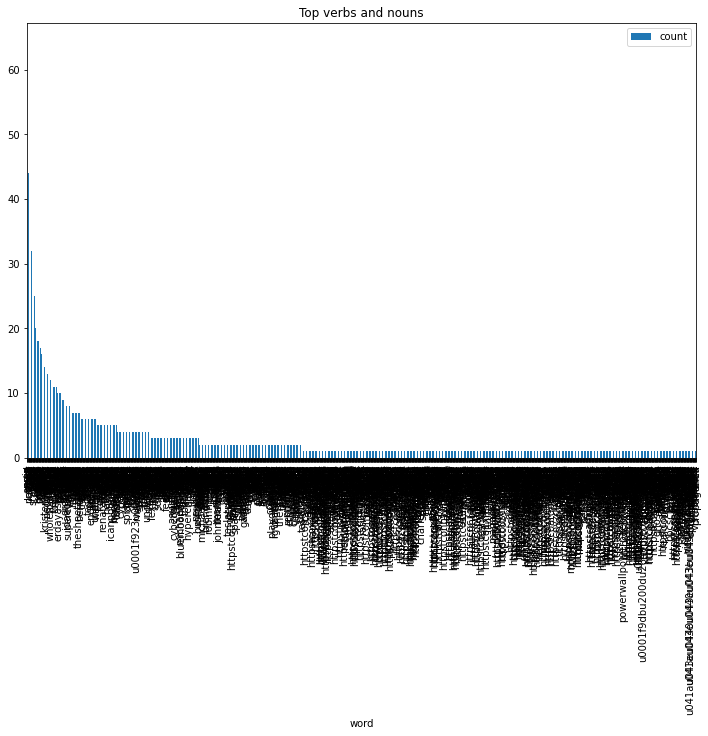

In [168]:
wf_df.plot.bar(x='word', figsize=(12,8), title='Top verbs and nouns')

In [169]:
import string
import spacy

In [170]:
from matplotlib.pyplot import imread
from matplotlib import pyplot as plt

In [171]:
affin=pd.read_csv("Afinn.csv",encoding="ISO-8859-1")
affin


,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [172]:
import nltk

In [173]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [174]:
from nltk import tokenize
sentences = tokenize.sent_tokenize(" ".join(data))
sentences[0:10]

['@kunalb11 I\x92m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level.',
 'Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year.',
 'Now on to the next for even more!!',
 'Happy New Year of the Ox!',
 'https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all.',
 'https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed!',
 'Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It\x92s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock 

In [175]:
sent_df = pd.DataFrame(sentences, columns=['sentence'])
sent_df

,sentence
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...
1,Have you tried it?
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated @teslacn Congr...
4,Now on to the next for even more!!
...,...
919,"@kenyanwalstreet Not actually a payout, just a..."
920,"It may never pay out, as the stock cant b ht..."
921,Details Aug 28.
922,AI symbiosis while u wait @vistacruiser7 @flcn...


In [176]:
affinity_scores = affin.set_index('word')['value'].to_dict()

In [177]:
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [178]:
nlp = spacy.load('en_core_web_md')
sentiment_lexicon = affinity_scores

def calculate_sentiment(text: str = None):
    sent_score = 0
    if text:
        sentence = nlp(text)
        for word in sentence:
            sent_score += sentiment_lexicon.get(word.lemma_, 0)
    return sent_score

In [179]:
sent_df['sentiment_value'] = sent_df['sentence'].apply(calculate_sentiment)
sent_df

,sentence,sentiment_value
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...,0
1,Have you tried it?,0
2,@joerogan @Spotify Great interview!,3
3,@gtera27 Doge is underestimated @teslacn Congr...,3
4,Now on to the next for even more!!,0
...,...,...
919,"@kenyanwalstreet Not actually a payout, just a...",0
920,"It may never pay out, as the stock cant b ht...",-4
921,Details Aug 28.,0
922,AI symbiosis while u wait @vistacruiser7 @flcn...,-2


In [180]:
sent_df[sent_df.sentiment_value<-4]


,sentence,sentiment_value
64,"Also, the road to hell is mostly paved with ba...",-7
647,Very ba https://t.co/tJsh1Exz1Q @justpaulinel...,-8
837,Cool Model 3 review by @iamjamiefoxx https://t...,-7


In [181]:
sent_df[sent_df.sentiment_value>10]

,sentence,sentiment_value
36,"@ajtourville @Erdayastronaut @SpaceX Yes, but ...",13
81,@teslaownersSV This is a good one @MrBeastYT I...,13
105,@Erdayastronaut @SpaceX Was also thinking that...,16
123,It isnt enough to be safer than human drivers...,12
184,"Also, w https://t.co/IYdKttVsqk @cleantechnic...",12
224,"@PPathole @karpathy For a second there, I thou...",11
258,@TheOnion @ID_AA_Carmack Yup @flcnhvy Change o...,11
585,The open areas https://t.co/rabjKrtQlw @Sav...,14
645,Its https://t.co/IxhyT6NuiC @Teslarati Tesla...,13
719,We just havent observed the https://t.co/mez...,17


In [182]:
sent_df['word_count'] = sent_df['sentence'].str.split().apply(len)
sent_df

,sentence,sentiment_value,word_count
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...,0,13
1,Have you tried it?,0,4
2,@joerogan @Spotify Great interview!,3,4
3,@gtera27 Doge is underestimated @teslacn Congr...,3,13
4,Now on to the next for even more!!,0,8
...,...,...,...
919,"@kenyanwalstreet Not actually a payout, just a...",0,11
920,"It may never pay out, as the stock cant b ht...",-4,31
921,Details Aug 28.,0,3
922,AI symbiosis while u wait @vistacruiser7 @flcn...,-2,47


In [183]:
sent_df.sort_values(by='sentiment_value').tail(10)

,sentence,sentiment_value,word_count
224,"@PPathole @karpathy For a second there, I thou...",11,69
817,Might be able to https://t.co/FB7e5nOq2E @Pri...,11,72
184,"Also, w https://t.co/IYdKttVsqk @cleantechnic...",12,98
123,It isnt enough to be safer than human drivers...,12,51
36,"@ajtourville @Erdayastronaut @SpaceX Yes, but ...",13,231
81,@teslaownersSV This is a good one @MrBeastYT I...,13,38
645,Its https://t.co/IxhyT6NuiC @Teslarati Tesla...,13,65
585,The open areas https://t.co/rabjKrtQlw @Sav...,14,138
105,@Erdayastronaut @SpaceX Was also thinking that...,16,94
719,We just havent observed the https://t.co/mez...,17,72


In [184]:
sent_df['sentiment_value'].describe()

count    924.000000
mean       1.373377
std        2.720689
min       -8.000000
25%        0.000000
50%        0.000000
75%        3.000000
max       17.000000
Name: sentiment_value, dtype: float64

In [185]:
sent_df['index']=range(0,len(sent_df))
sent_df

,sentence,sentiment_value,word_count,index
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...,0,13,0
1,Have you tried it?,0,4,1
2,@joerogan @Spotify Great interview!,3,4,2
3,@gtera27 Doge is underestimated @teslacn Congr...,3,13,3
4,Now on to the next for even more!!,0,8,4
...,...,...,...,...
919,"@kenyanwalstreet Not actually a payout, just a...",0,11,919
920,"It may never pay out, as the stock cant b ht...",-4,31,920
921,Details Aug 28.,0,3,921
922,AI symbiosis while u wait @vistacruiser7 @flcn...,-2,47,922


In [186]:
sent_df['Sentiment_Class'] = pd.cut(x=sent_df['sentiment_value'],bins=[-8, -1, 0, 17], 
                                    labels=['Negative','Neutral','Positive'], right = True)
sent_df.sample(10)


,sentence,sentiment_value,word_count,index,Sentiment_Class
212,Autonomous docking tomorrow at approximately 1...,3,26,212,Positive
241,Might have been tempting fate!,0,5,241,Neutral
451,"Had Mobi-C disc put in at C5-C6, however 1st s...",-1,17,451,Negative
904,Superchargers and public high power wall c ht...,0,28,904,Neutral
184,"Also, w https://t.co/IYdKttVsqk @cleantechnic...",12,98,184,Positive
3,@gtera27 Doge is underestimated @teslacn Congr...,3,13,3,Positive
351,CureVac has version 2 in use.,0,6,351,Neutral
660,@EvaFoxU That number sure comes up a lot <U+00...,2,17,660,Positive
573,@Tesla explain The extreme difficulty of scali...,0,15,573,Neutral
70,"@cleantechnica To my surprise, Tesla has bette...",1,31,70,Positive


In [187]:
sent_df['Sentiment_Class'].value_counts()

Positive    432
Neutral     381
Negative    110
Name: Sentiment_Class, dtype: int64

In [188]:
import seaborn as sns
import matplotlib.pyplot as plt

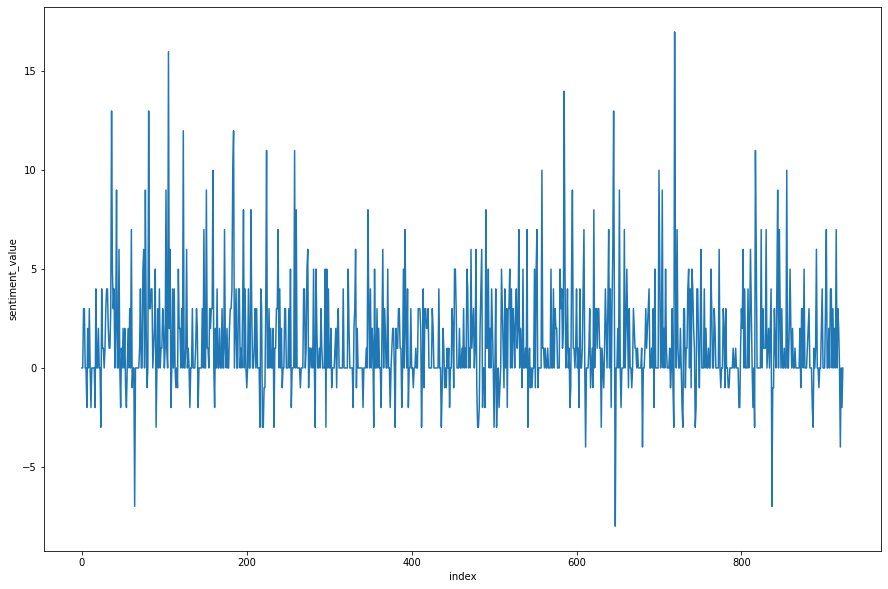

In [189]:
plt.figure(figsize=(15, 10))
sns.lineplot(y='sentiment_value',x='index',data=sent_df)

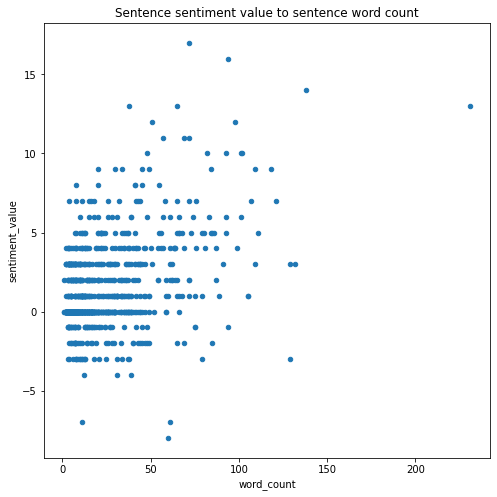

In [190]:
sent_df.plot.scatter(x='word_count', y='sentiment_value', figsize=(8,8), title='Sentence sentiment value to sentence word count')

In [191]:
sent_df['sentiment_Class'] = pd.cut(x=sent_df['sentiment_value'],bins=[-8, -1, 0, 17], 
                                    labels=['Negative','Neutral','Positive'], right = True)
sent_df.sample(10)

,sentence,sentiment_value,word_count,index,Sentiment_Class,sentiment_Class
849,"Please inquire, if interested.",3,4,849,Positive,Positive
545,I was referring to a future car that will be s...,0,14,545,Neutral,Neutral
170,<U+2665><U+FE0F> i love all u crazy ppl out th...,3,22,170,Positive,Positive
558,Starship SN8 with rear body flaps https://t.co...,10,82,558,Positive,Positive
60,https://t.co/RZtkDzAewJ @LabPadre Passed initi...,7,76,60,Positive,Positive
58,Wild times on Discord haha.,3,5,58,Positive,Positive
324,Worth a read.,2,3,324,Positive,Positive
446,We also have to consider population life-month...,-2,49,446,Negative,Negative
200,Fuel header tank pressure was low during landi...,-1,35,200,Negative,Negative
607,@PPathole @_rykllan @FelixSchlang @spaceXcentr...,1,42,607,Positive,Positive


In [192]:
sent_df['sentiment_Class'].value_counts()

Positive    432
Neutral     381
Negative    110
Name: sentiment_Class, dtype: int64

In [193]:
# After performing sentiment analysis we can conclude that most sentences of it are positive


In [194]:
# Generate WordCloud

In [195]:
# Import packages
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS

In [196]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

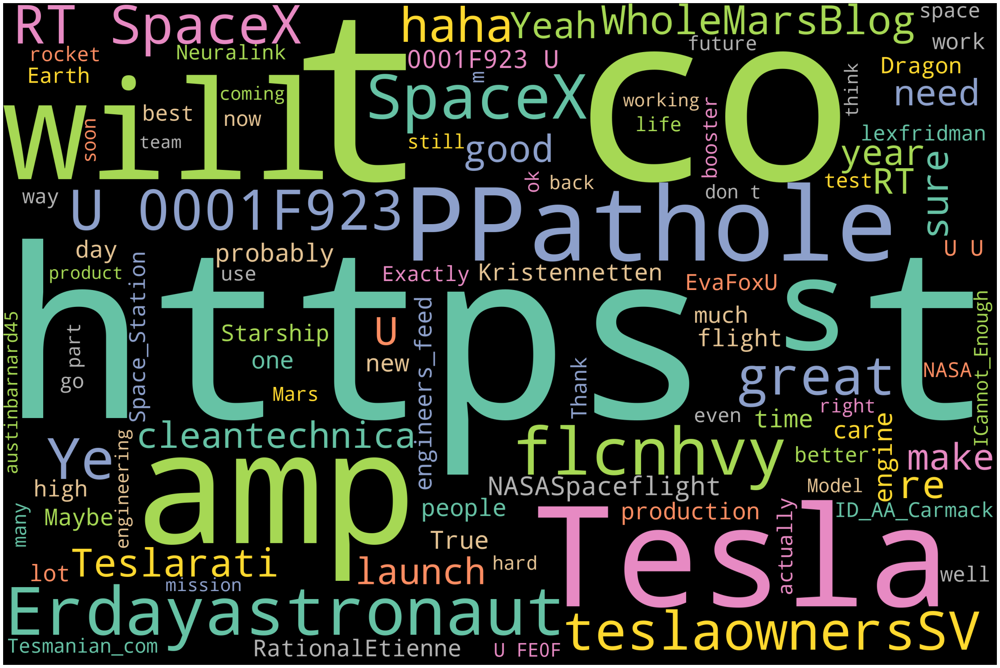

In [197]:
# Generate wordcloud
stopwords = STOPWORDS
wordcloud = WordCloud(width = 3000, height = 2000, background_color='black', max_words=100,
                      colormap='Set2',stopwords=stopwords).generate(text)
# Plot
plot_cloud(wordcloud)

In [198]:
# AMAZON REVIEW DATASET

In [199]:
import numpy as np 
import pandas as pd 
import string
import spacy 


In [200]:
from matplotlib.pyplot import imread
import matplotlib.pyplot as plt
import seaborn as sns

In [201]:
data=pd.read_csv("Musical_instruments_reviews.csv")
data

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]","Not much to write about here, but it does exac...",5.0,good,1393545600,"02 28, 2014"
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",The product does exactly as it should and is q...,5.0,Jake,1363392000,"03 16, 2013"
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",The primary job of this device is to block the...,5.0,It Does The Job Well,1377648000,"08 28, 2013"
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",Nice windscreen protects my MXL mic and preven...,5.0,GOOD WINDSCREEN FOR THE MONEY,1392336000,"02 14, 2014"
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",This pop filter is great. It looks and perform...,5.0,No more pops when I record my vocals.,1392940800,"02 21, 2014"
...,...,...,...,...,...,...,...,...,...
10256,A14B2YH83ZXMPP,B00JBIVXGC,Lonnie M. Adams,"[0, 0]","Great, just as expected. Thank to all.",5.0,Five Stars,1405814400,"07 20, 2014"
10257,A1RPTVW5VEOSI,B00JBIVXGC,Michael J. Edelman,"[0, 0]",I've been thinking about trying the Nanoweb st...,5.0,"Long life, and for some players, a good econom...",1404259200,"07 2, 2014"
10258,AWCJ12KBO5VII,B00JBIVXGC,Michael L. Knapp,"[0, 0]",I have tried coated strings in the past ( incl...,4.0,Good for coated.,1405987200,"07 22, 2014"
10259,A2Z7S8B5U4PAKJ,B00JBIVXGC,"Rick Langdon ""Scriptor""","[0, 0]","Well, MADE by Elixir and DEVELOPED with Taylor...",4.0,Taylor Made,1404172800,"07 1, 2014"


In [202]:
# Renaming columns for ease of reference
data= data.rename({'reviewerID':'review_id', 'asin':'code', 'reviewerName':'review_name', 'reviewText':'review_text', 
               'unixReviewTime':'unix_review_time', 'reviewTime':'review_time'}, axis = 1)
data.head()

,review_id,code,review_name,helpful,review_text,overall,summary,unix_review_time,review_time
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]","Not much to write about here, but it does exac...",5.0,good,1393545600,"02 28, 2014"
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",The product does exactly as it should and is q...,5.0,Jake,1363392000,"03 16, 2013"
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",The primary job of this device is to block the...,5.0,It Does The Job Well,1377648000,"08 28, 2013"
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",Nice windscreen protects my MXL mic and preven...,5.0,GOOD WINDSCREEN FOR THE MONEY,1392336000,"02 14, 2014"
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",This pop filter is great. It looks and perform...,5.0,No more pops when I record my vocals.,1392940800,"02 21, 2014"


In [203]:
len(data)

10261

In [204]:
data.describe()

,overall,unix_review_time
count,10261.000000,1.026100e+04
mean,4.488744,1.360606e+09
std,0.894642,3.779735e+07
min,1.000000,1.095466e+09
25%,4.000000,1.343434e+09
50%,5.000000,1.368490e+09
75%,5.000000,1.388966e+09
max,5.000000,1.405987e+09


In [205]:
data.columns

Index(['review_id', 'code', 'review_name', 'helpful', 'review_text', 'overall',
       'summary', 'unix_review_time', 'review_time'],
      dtype='object')

In [206]:
# Checking for NA values
data.isna().sum()

review_id            0
code                 0
review_name         27
helpful              0
review_text          7
overall              0
summary              0
unix_review_time     0
review_time          0
dtype: int64

In [207]:
data['review_text'] = data['review_text'].fillna('Missing')

In [208]:
# Concatinating review_text and summary
data['reviews'] = data['review_text'] + data['summary']

# Dropping review_text and summary

data = data.drop(['review_text', 'summary'], axis = 1)

data.head()

,review_id,code,review_name,helpful,overall,unix_review_time,review_time,reviews
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"02 28, 2014","Not much to write about here, but it does exac..."
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,"03 16, 2013",The product does exactly as it should and is q...
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,"08 28, 2013",The primary job of this device is to block the...
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,"02 14, 2014",Nice windscreen protects my MXL mic and preven...
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,"02 21, 2014",This pop filter is great. It looks and perform...


In [209]:
data[data.duplicated()]

,review_id,code,review_name,helpful,overall,unix_review_time,review_time,reviews


In [210]:
data=data.drop_duplicates()

In [211]:
data.isnull().sum()

review_id            0
code                 0
review_name         27
helpful              0
overall              0
unix_review_time     0
review_time          0
reviews              0
dtype: int64

In [212]:
data=data.dropna()

In [213]:
data

,review_id,code,review_name,helpful,overall,unix_review_time,review_time,reviews
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"02 28, 2014","Not much to write about here, but it does exac..."
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,"03 16, 2013",The product does exactly as it should and is q...
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,"08 28, 2013",The primary job of this device is to block the...
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,"02 14, 2014",Nice windscreen protects my MXL mic and preven...
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,"02 21, 2014",This pop filter is great. It looks and perform...
...,...,...,...,...,...,...,...,...
10256,A14B2YH83ZXMPP,B00JBIVXGC,Lonnie M. Adams,"[0, 0]",5.0,1405814400,"07 20, 2014","Great, just as expected. Thank to all.Five Stars"
10257,A1RPTVW5VEOSI,B00JBIVXGC,Michael J. Edelman,"[0, 0]",5.0,1404259200,"07 2, 2014",I've been thinking about trying the Nanoweb st...
10258,AWCJ12KBO5VII,B00JBIVXGC,Michael L. Knapp,"[0, 0]",4.0,1405987200,"07 22, 2014",I have tried coated strings in the past ( incl...
10259,A2Z7S8B5U4PAKJ,B00JBIVXGC,"Rick Langdon ""Scriptor""","[0, 0]",4.0,1404172800,"07 1, 2014","Well, MADE by Elixir and DEVELOPED with Taylor..."


In [214]:
data = data['reviews']

In [215]:
data

0        Not much to write about here, but it does exac...
1        The product does exactly as it should and is q...
2        The primary job of this device is to block the...
3        Nice windscreen protects my MXL mic and preven...
4        This pop filter is great. It looks and perform...
                               ...                        
10256    Great, just as expected.  Thank to all.Five Stars
10257    I've been thinking about trying the Nanoweb st...
10258    I have tried coated strings in the past ( incl...
10259    Well, MADE by Elixir and DEVELOPED with Taylor...
10260    These strings are really quite good, but I wou...
Name: reviews, Length: 10234, dtype: object

In [216]:

data = pd.DataFrame(data)

In [217]:
data

,reviews
0,"Not much to write about here, but it does exac..."
1,The product does exactly as it should and is q...
2,The primary job of this device is to block the...
3,Nice windscreen protects my MXL mic and preven...
4,This pop filter is great. It looks and perform...
...,...
10256,"Great, just as expected. Thank to all.Five Stars"
10257,I've been thinking about trying the Nanoweb st...
10258,I have tried coated strings in the past ( incl...
10259,"Well, MADE by Elixir and DEVELOPED with Taylor..."


In [218]:
data = [reviews.strip() for reviews in data.reviews] # remove both the leading and the trailing characters
data = [reviews for reviews in data if reviews] # removes empty strings, because they are considered in Python as False
data

["Not much to write about here, but it does exactly what it's supposed to. filters out the pop sounds. now my recordings are much more crisp. it is one of the lowest prices pop filters on amazon so might as well buy it, they honestly work the same despite their pricing,good",
 "The product does exactly as it should and is quite affordable.I did not realized it was double screened until it arrived, so it was even better than I had expected.As an added bonus, one of the screens carries a small hint of the smell of an old grape candy I used to buy, so for reminiscent's sake, I cannot stop putting the pop filter next to my nose and smelling it after recording. :DIf you needed a pop filter, this will work just as well as the expensive ones, and it may even come with a pleasing aroma like mine did!Buy this product! :]Jake",
 'The primary job of this device is to block the breath that would otherwise produce a popping sound, while allowing your voice to pass through with no noticeable reducti

In [219]:
# Joining the list into one string/text
text = ' '.join(data)
text

'Not much to write about here, but it does exactly what it\'s supposed to. filters out the pop sounds. now my recordings are much more crisp. it is one of the lowest prices pop filters on amazon so might as well buy it, they honestly work the same despite their pricing,good The product does exactly as it should and is quite affordable.I did not realized it was double screened until it arrived, so it was even better than I had expected.As an added bonus, one of the screens carries a small hint of the smell of an old grape candy I used to buy, so for reminiscent\'s sake, I cannot stop putting the pop filter next to my nose and smelling it after recording. :DIf you needed a pop filter, this will work just as well as the expensive ones, and it may even come with a pleasing aroma like mine did!Buy this product! :]Jake The primary job of this device is to block the breath that would otherwise produce a popping sound, while allowing your voice to pass through with no noticeable reduction of v

In [220]:
#Punctuation
no_punc_text = text.translate(str.maketrans('', '', string.punctuation)) 
no_punc_text

'Not much to write about here but it does exactly what its supposed to filters out the pop sounds now my recordings are much more crisp it is one of the lowest prices pop filters on amazon so might as well buy it they honestly work the same despite their pricinggood The product does exactly as it should and is quite affordableI did not realized it was double screened until it arrived so it was even better than I had expectedAs an added bonus one of the screens carries a small hint of the smell of an old grape candy I used to buy so for reminiscents sake I cannot stop putting the pop filter next to my nose and smelling it after recording DIf you needed a pop filter this will work just as well as the expensive ones and it may even come with a pleasing aroma like mine didBuy this product Jake The primary job of this device is to block the breath that would otherwise produce a popping sound while allowing your voice to pass through with no noticeable reduction of volume or high frequencies

In [221]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [222]:
#Tokenization
from nltk.tokenize import word_tokenize
text_tokens = word_tokenize(no_punc_text)
print(text_tokens[0:50])

['Not', 'much', 'to', 'write', 'about', 'here', 'but', 'it', 'does', 'exactly', 'what', 'its', 'supposed', 'to', 'filters', 'out', 'the', 'pop', 'sounds', 'now', 'my', 'recordings', 'are', 'much', 'more', 'crisp', 'it', 'is', 'one', 'of', 'the', 'lowest', 'prices', 'pop', 'filters', 'on', 'amazon', 'so', 'might', 'as', 'well', 'buy', 'it', 'they', 'honestly', 'work', 'the', 'same', 'despite', 'their']


In [223]:
#Normalize the data
lower_words = [text.lower() for text in text_tokens]
print(lower_words[0:25])

['not', 'much', 'to', 'write', 'about', 'here', 'but', 'it', 'does', 'exactly', 'what', 'its', 'supposed', 'to', 'filters', 'out', 'the', 'pop', 'sounds', 'now', 'my', 'recordings', 'are', 'much', 'more']


In [224]:
#Remove stopwords
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [225]:
my_stop_words = stopwords.words('english')
my_stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [226]:
my_stop_words.append('the')
no_stop_tokens = [word for word in lower_words if not word in my_stop_words]
print(no_stop_tokens[0:40])

['much', 'write', 'exactly', 'supposed', 'filters', 'pop', 'sounds', 'recordings', 'much', 'crisp', 'one', 'lowest', 'prices', 'pop', 'filters', 'amazon', 'might', 'well', 'buy', 'honestly', 'work', 'despite', 'pricinggood', 'product', 'exactly', 'quite', 'affordablei', 'realized', 'double', 'screened', 'arrived', 'even', 'better', 'expectedas', 'added', 'bonus', 'one', 'screens', 'carries', 'small']


In [227]:
len(no_stop_tokens)

498079

In [228]:
len(lower_words)

955509

In [229]:
#Stemming
from nltk.stem import PorterStemmer
ps = PorterStemmer()

In [230]:
stemmed_tokens = [ps.stem(word) for word in no_stop_tokens]
print(stemmed_tokens[0:40])

['much', 'write', 'exactli', 'suppos', 'filter', 'pop', 'sound', 'record', 'much', 'crisp', 'one', 'lowest', 'price', 'pop', 'filter', 'amazon', 'might', 'well', 'buy', 'honestli', 'work', 'despit', 'pricinggood', 'product', 'exactli', 'quit', 'affordablei', 'realiz', 'doubl', 'screen', 'arriv', 'even', 'better', 'expecteda', 'ad', 'bonu', 'one', 'screen', 'carri', 'small']


In [231]:
nlp = spacy.load('en_core_web_md')

In [236]:
lemmas = [token.lemma_ for token in doc]
print(lemmas[0:25])

['kunalb11', 'i\x92m', 'alien', 'idaacarmack', 'ray', 'trace', 'cyberpunk', 'hdr', 'nextlevel', 'tri', 'joerogan', 'spotifi', 'great', 'interview', 'gtera27', 'doge', 'underestim', 'teslacn', 'congratul', 'tesla', 'china', 'amaz', 'execut', 'last', 'year']


In [238]:
import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [239]:
for w in lower_words:
    print(w, " : ", lemmatizer.lemmatize(w))

  :  20
minutes  :  minute
to  :  to
install  :  install
this  :  this
bad  :  bad
boywhen  :  boywhen
i  :  i
tested  :  tested
it  :  it
out  :  out
i  :  i
was  :  wa
blown  :  blown
away  :  away
it  :  it
sounded  :  sounded
beautiful  :  beautiful
just  :  just
like  :  like
my  :  my
taylor  :  taylor
only  :  only
louderthe  :  louderthe
true  :  true
test  :  test
was  :  wa
an  :  an
actual  :  actual
live  :  live
performance  :  performance
i  :  i
brought  :  brought
my  :  my
baggs  :  baggs
para  :  para
acoustic  :  acoustic
di  :  di
and  :  and
i  :  i
was  :  wa
glad  :  glad
i  :  i
didi  :  didi
was  :  wa
able  :  able
to  :  to
adjust  :  adjust
the  :  the
eq  :  eq
just  :  just
a  :  a
tad  :  tad
cut  :  cut
some  :  some
of  :  of
the  :  the
midrange  :  midrange
a  :  a
bit  :  bit
and  :  and
it  :  it
sounded  :  sounded
even  :  even
betteri  :  betteri
could  :  could
not  :  not
believe  :  believe
it  :  it
it  :  it
literally  :  literally
gave  :  

KeyboardInterrupt: ignored

In [240]:
one_block = data[3]
one_block
doc_block = nlp(one_block)
spacy.displacy.render(doc_block, style='ent', jupyter=True)

In [241]:
one_block

'Nice windscreen protects my MXL mic and prevents pops. Only thing is that the gooseneck is only marginally able to hold the screen in position and requires careful positioning of the clamp to avoid sagging.GOOD WINDSCREEN FOR THE MONEY'

In [242]:
doc_block

Nice windscreen protects my MXL mic and prevents pops. Only thing is that the gooseneck is only marginally able to hold the screen in position and requires careful positioning of the clamp to avoid sagging.GOOD WINDSCREEN FOR THE MONEY

In [243]:
len(data)

10234

In [249]:
one_block = data[1235]
one_block
doc_block = nlp(one_block)
spacy.displacy.render(doc_block, style='ent', jupyter=True)

In [245]:
one_block

'I found this tool to be convenient and better made than I anticipated, making it a solid value for the money.  No need for a collection of separate tools anymore.Excellent Multi-tool'

In [246]:
doc_block

I found this tool to be convenient and better made than I anticipated, making it a solid value for the money.  No need for a collection of separate tools anymore.Excellent Multi-tool

In [247]:
for token in doc_block:
    print(token, token.pos_)

I PRON
found VERB
this DET
tool NOUN
to PART
be AUX
convenient ADJ
and CCONJ
better ADV
made VERB
than SCONJ
I PRON
anticipated VERB
, PUNCT
making VERB
it PRON
a DET
solid ADJ
value NOUN
for ADP
the DET
money NOUN
. PUNCT
  SPACE
No DET
need NOUN
for ADP
a DET
collection NOUN
of ADP
separate ADJ
tools NOUN
anymore ADV
. PUNCT
Excellent ADJ
Multi NOUN
- NOUN
tool NOUN


In [248]:
nouns_verbs = [token.text for token in doc_block if token.pos_ in ('NOUN', 'VERB')]
print(nouns_verbs)

['found', 'tool', 'made', 'anticipated', 'making', 'value', 'money', 'need', 'collection', 'tools', 'Multi', '-', 'tool']


In [250]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

X = cv.fit_transform(nouns_verbs)
sum_words = X.sum(axis=0)
words_freq=[(word, sum_words[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key = lambda x: x[1], reverse=True)
wf_df = pd.DataFrame(words_freq)
wf_df.columns = ['word', 'count']

In [251]:
wf_df

,word,count
0,tool,2
1,found,1
2,made,1
3,anticipated,1
4,making,1
5,value,1
6,money,1
7,need,1
8,collection,1
9,tools,1


In [252]:
print(X)

  (0, 2)	1
  (1, 8)	1
  (2, 3)	1
  (3, 0)	1
  (4, 4)	1
  (5, 10)	1
  (6, 5)	1
  (7, 7)	1
  (8, 1)	1
  (9, 9)	1
  (10, 6)	1
  (12, 8)	1


In [253]:
print(sum_words)

[[1 1 1 1 1 1 1 1 2 1 1]]


In [254]:
print(words_freq)


[('tool', 2), ('found', 1), ('made', 1), ('anticipated', 1), ('making', 1), ('value', 1), ('money', 1), ('need', 1), ('collection', 1), ('tools', 1), ('multi', 1)]


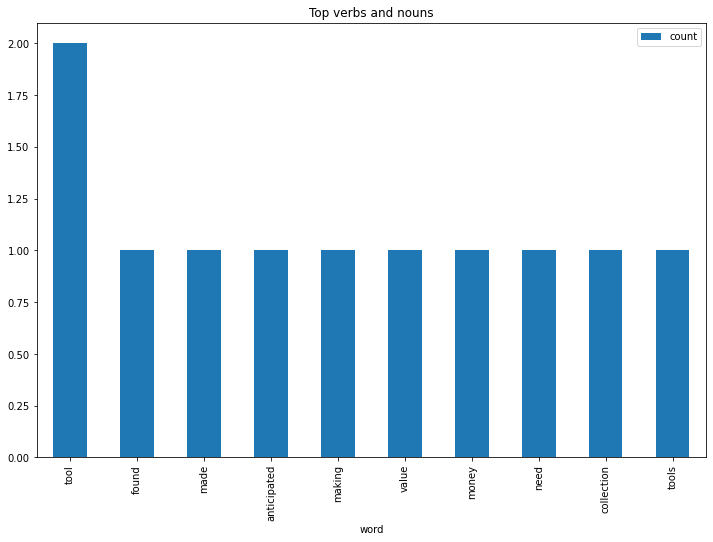

In [255]:
wf_df[0:10].plot.bar(x='word', figsize=(12,8), title='Top verbs and nouns')


In [256]:
import string
import spacy

In [257]:
from matplotlib.pyplot import imread

In [258]:
affin=pd.read_csv("Afinn.csv",encoding="ISO-8859-1")
affin

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [259]:
data

["Not much to write about here, but it does exactly what it's supposed to. filters out the pop sounds. now my recordings are much more crisp. it is one of the lowest prices pop filters on amazon so might as well buy it, they honestly work the same despite their pricing,good",
 "The product does exactly as it should and is quite affordable.I did not realized it was double screened until it arrived, so it was even better than I had expected.As an added bonus, one of the screens carries a small hint of the smell of an old grape candy I used to buy, so for reminiscent's sake, I cannot stop putting the pop filter next to my nose and smelling it after recording. :DIf you needed a pop filter, this will work just as well as the expensive ones, and it may even come with a pleasing aroma like mine did!Buy this product! :]Jake",
 'The primary job of this device is to block the breath that would otherwise produce a popping sound, while allowing your voice to pass through with no noticeable reducti

In [260]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [261]:
from nltk import tokenize
sentences = tokenize.sent_tokenize(" ".join(data))
sentences[0:10]

["Not much to write about here, but it does exactly what it's supposed to.",
 'filters out the pop sounds.',
 'now my recordings are much more crisp.',
 "it is one of the lowest prices pop filters on amazon so might as well buy it, they honestly work the same despite their pricing,good The product does exactly as it should and is quite affordable.I did not realized it was double screened until it arrived, so it was even better than I had expected.As an added bonus, one of the screens carries a small hint of the smell of an old grape candy I used to buy, so for reminiscent's sake, I cannot stop putting the pop filter next to my nose and smelling it after recording.",
 ':DIf you needed a pop filter, this will work just as well as the expensive ones, and it may even come with a pleasing aroma like mine did!Buy this product!',
 ':]Jake The primary job of this device is to block the breath that would otherwise produce a popping sound, while allowing your voice to pass through with no notice

In [262]:
sent_df = pd.DataFrame(sentences, columns=['sentence'])
sent_df

,sentence
0,"Not much to write about here, but it does exac..."
1,filters out the pop sounds.
2,now my recordings are much more crisp.
3,it is one of the lowest prices pop filters on ...
4,":DIf you needed a pop filter, this will work j..."
...,...
45716,This is the only complaint I have about these ...
45717,If the unwound strings were a tiny bit brighte...
45718,"As it stands, I give them 4.5 stars... not a b..."
45719,I put these on a jumbo and it definitely accen...


In [263]:
affinity_scores = affin.set_index('word')['value'].to_dict()


In [264]:
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [265]:
nlp = spacy.load('en_core_web_md')
sentiment_lexicon = affinity_scores

def calculate_sentiment(text: str = None):
    sent_score = 0
    if text:
        sentence = nlp(text)
        for word in sentence:
            sent_score += sentiment_lexicon.get(word.lemma_, 0)
    return sent_score

In [266]:
sent_df['sentiment_value'] = sent_df['sentence'].apply(calculate_sentiment)

In [267]:
sent_df

,sentence,sentiment_value
0,"Not much to write about here, but it does exac...",0
1,filters out the pop sounds.,0
2,now my recordings are much more crisp.,0
3,it is one of the lowest prices pop filters on ...,2
4,":DIf you needed a pop filter, this will work j...",2
...,...,...
45716,This is the only complaint I have about these ...,0
45717,If the unwound strings were a tiny bit brighte...,0
45718,"As it stands, I give them 4.5 stars... not a b...",5
45719,I put these on a jumbo and it definitely accen...,0


In [268]:
sent_df[sent_df.sentiment_value<-2]

,sentence,sentiment_value
60,I am not terribly hard on my gear but my cable...,-6
115,Should last a lifetime of usage no problem and...,-3
130,Not sure about long-term durability or signal ...,-3
132,"Still, it works and was inexpensive.EDIT: 6 mo...",-3
135,"It seems to work well, no issues in the first ...",-3
...,...,...
45353,They have corrosion resistant packaging and si...,-3
45401,"as Rotosounds, and they're only a Jackson, not...",-3
45552,When I get together with other guitar players ...,-3
45553,A couple Ernie Ball die hards are about ready ...,-3


In [269]:
sent_df[sent_df.sentiment_value>10]

,sentence,sentiment_value
78,The green cable is good for that.Cheap and coo...,16
98,A good quality cable at a very good price.Good...,12
114,"My son, who has some experience as a musician ...",21
169,Fantastic deal for this cable.Nice high qualit...,13
180,"If problems arise later with this cable, I wil...",19
...,...,...
45580,"For now, even if they only last as long as the...",12
45614,"The bottom dropped out, the top end stopped si...",11
45637,"So far now, they sound great, feel great...and...",12
45714,I may also try them on my older 814ce just to ...,13


In [270]:
sent_df['word_count'] = sent_df['sentence'].str.split().apply(len)
sent_df.head(10)

,sentence,sentiment_value,word_count
0,"Not much to write about here, but it does exac...",0,14
1,filters out the pop sounds.,0,5
2,now my recordings are much more crisp.,0,7
3,it is one of the lowest prices pop filters on ...,2,98
4,":DIf you needed a pop filter, this will work j...",2,30
5,:]Jake The primary job of this device is to bl...,-1,35
6,The double cloth filter blocks the pops and le...,-2,15
7,The metal clamp mount attaches to the mike sta...,2,15
8,The goose neck needs a little coaxing to stay ...,0,26
9,Only thing is that the gooseneck is only margi...,4,35


In [271]:
sent_df.sort_values(by='sentiment_value').tail(10)

,sentence,sentiment_value,word_count
12719,Love it.Ernie ball strings The fact of the pri...,26,151
22315,Nice clean boost and a good overdrive sound wh...,26,172
30236,"Solid, nice sound, very good quality to make a...",27,89
5694,When they start sounding a little dull it wipe...,27,46
28522,"its very easy to use and program, I did not ha...",28,166
21520,That feature is great for beginners who might ...,28,165
32445,")(6) OK paint job, doesn't really catch my eye...",29,248
1016,"Easy to play, and they sound great.long lastin...",29,105
37369,"The sound recorded, while crystal clear is a l...",30,430
24126,Def recommend if you have alot of pedals and o...,38,52


In [272]:
sent_df['sentiment_value'].describe()

count    45721.000000
mean         1.762757
std          3.068579
min        -13.000000
25%          0.000000
50%          1.000000
75%          3.000000
max         38.000000
Name: sentiment_value, dtype: float64

In [273]:
sent_df['index']=range(0,len(sent_df))
sent_df

,sentence,sentiment_value,word_count,index
0,"Not much to write about here, but it does exac...",0,14,0
1,filters out the pop sounds.,0,5,1
2,now my recordings are much more crisp.,0,7,2
3,it is one of the lowest prices pop filters on ...,2,98,3
4,":DIf you needed a pop filter, this will work j...",2,30,4
...,...,...,...,...
45716,This is the only complaint I have about these ...,0,10,45716
45717,If the unwound strings were a tiny bit brighte...,0,14,45717
45718,"As it stands, I give them 4.5 stars... not a b...",5,24,45718
45719,I put these on a jumbo and it definitely accen...,0,16,45719


In [274]:
sent_df['Sentiment_Class'] = pd.cut(x=sent_df['sentiment_value'],bins=[-8, -1, 0, 17], 
                                    labels=['Negative','Neutral','Positive'], right = True)
sent_df.sample(10)


,sentence,sentiment_value,word_count,index,Sentiment_Class
22933,It feels very sturdy and I'm not worried about...,-3,13,22933,Negative
36142,Wrote to dealer that was listed as selling it ...,-2,24,36142,Negative
45631,Thanks to Bob Taylor and his crew for collabor...,7,33,45631,Positive
27095,)- 2 folding guitar stands- and still had room...,3,108,27095,Positive
3797,I put it on the boom of my mic stand.,0,10,3797,Neutral
15089,"In fact, the boom has a really nice adjusting ...",4,17,15089,Positive
6271,It's easy to take on and off.,1,7,6271,Positive
20167,It should also be noted that this amp is power...,0,29,20167,Neutral
8143,If anybody wants a durable acoustic 12 string ...,7,266,8143,Positive
15511,"However, there are two zip ties that secure th...",0,37,15511,Neutral


In [275]:
sent_df['Sentiment_Class'].value_counts()

Positive    24459
Neutral     15480
Negative     5655
Name: Sentiment_Class, dtype: int64

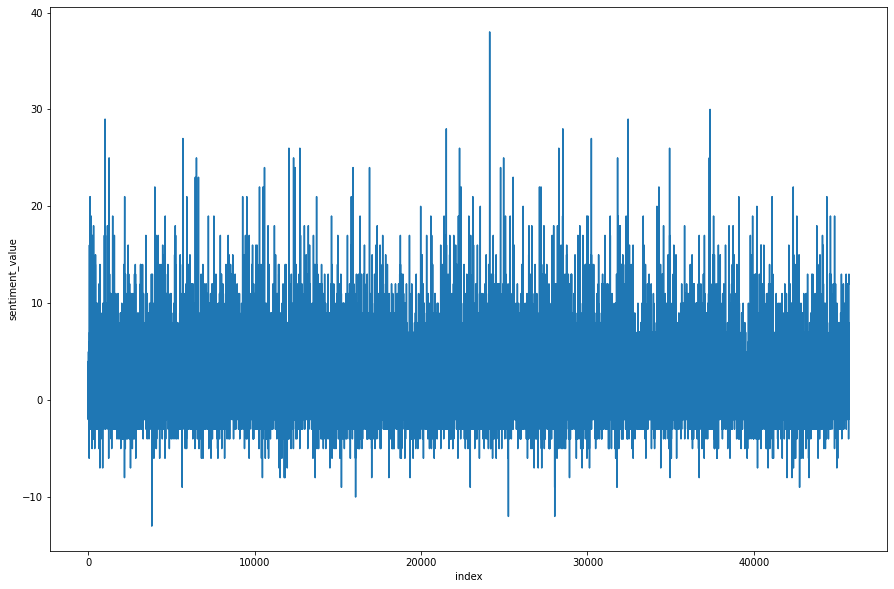

In [276]:
plt.figure(figsize=(15, 10))
sns.lineplot(y='sentiment_value',x='index',data=sent_df)

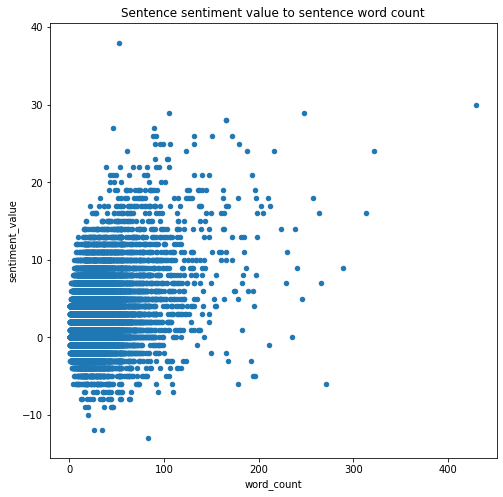

In [277]:
sent_df.plot.scatter(x='word_count', y='sentiment_value', figsize=(8,8), title='Sentence sentiment value to sentence word count')

In [278]:
#Generate wordcloud

In [279]:
# Import packages
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS

In [280]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

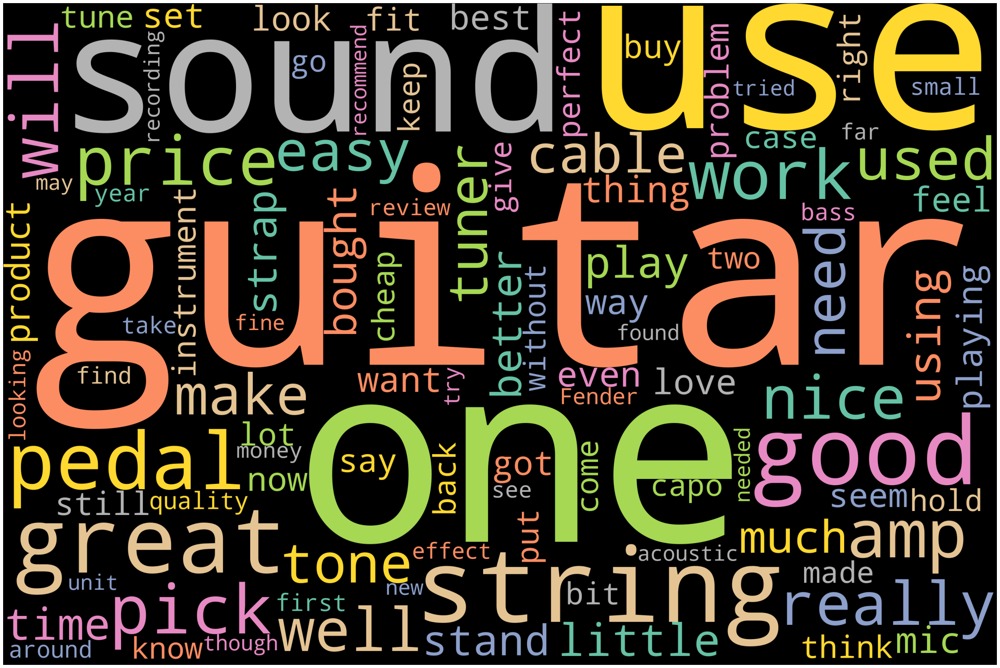

In [281]:
# Generate wordcloud
stopwords = STOPWORDS
wordcloud = WordCloud(width = 3000, height = 2000, background_color='black', max_words=100,
                      colormap='Set2',stopwords=stopwords).generate(text)
# Plot
plot_cloud(wordcloud)